In [2]:
from pydicom import dcmread ##dcmread enable python to read dicom file
import cv2 ## image process tool
import os
import numpy as np ## array
import pandas as pd ## dataframe
import matplotlib.pyplot ## figure generator
import matplotlib.pyplot as plt ## figure generator
from scipy.interpolate import make_interp_spline ## smooth the force time data
import winsound ## notification noise
import math ## calculate the subluxation with anchors
import time ## measure the operation time cost
from IPython.display import clear_output ## to clear the incorrect input in the console

## Phase I Import DCM file and get all the details

In [3]:
class U:
    ## If the utils is independent from the main program, don't forget to change the print content
    def __init__(self):
        print("Activating Utils...",'Current Utils path: ',os.path.join(os.getcwd(),'Alice_v05.ipynb'))
        return
    
    ## Dir_Detector is a function to check if the file is exist
    def Dir_Detector(self):
        print("Activating Utils / Dir_Detector")
        return self
    
    ## dataprocess is a function that contains data format clarify and normalize into uniform
    def dataprocess(self):
        print("Call func dataprocess")
        return self
    
    ## smooth is a function which can filter the stress signal to reduce the over-damping and make the output image more intuitive.
    def smooth(self,x,y):
        ## x is time, and y is stress signal
        x = np.array(x);y = np.array(y)
        x_smooth = np.linspace(x.min(),x.max(),500)
        y_smooth = make_interp_spline(x,y)(x_smooth)
        return [x_smooth , y_smooth]

    ## Beep and ErrorBeep is a funtion to hint the order is accepted successfully or failed
    def Beep(self):
        #print("Activating Utils / Beep")
        frequency = 500;duration = 450
        winsound.Beep(frequency,duration)
        time.sleep(0.15)
        return
    def ErrorBeep(self):
        #print("Activating Utils / ErrorBeep")
        frequency = 500;duration = 150
        for i in range(3):
            winsound.Beep(frequency+600,duration)
        time.sleep(0.15)
        return
    
    ## Save_as_GIF is a function which can transfer dicom file into a gif file
    def Save_as_GIF(self):
        print("Activating Utils_sub / Save_as_GIF")
        return self


In [4]:
class AliceV05:
    ## txtholder will transfer the txt file into class attribute
    def txt_loader(self):
        print("Call func txt_loader")
        rawdata = pd.DataFrame(np.loadtxt(self.filepath_txt))
        rawdata = rawdata.rename(columns = {0:'stress',1:'trigger',2:'_'})
        
        self.raw = rawdata                      ## self.rawdata is a full dataframe of txtfile
        self.stress = rawdata['stress']         ## self.stress is a cropped data of txtfile which only contain stress data
        self.trigger = rawdata['trigger']       ## self.trigger is a cropped data of txtfile which only contain trigger data
        print('-'*100,'\n',self.raw.head(10),'\n','-'*100,'\n')

        ## trigger state detector
        self.time_note = []
        thr = 0.1 ## threshold
        #thr = 0.8
        for i in range(len(self.trigger)-1):
            if (self.trigger[i]-thr)*(self.trigger[i+1]-thr) < 0:
                self.time_note.append(i)
            else:
                pass
        for i in range(0,len(self.time_note),2):
            print("Trigger activate note ",round(i/2+1),": ",self.time_note[i],"~",self.time_note[i+1],"(Duration: ",(self.time_note[i+1]-self.time_note[i])/1000,"s)")
        
        ## smooth self.smooth = filtered stress
        self.smooth = self.utils.smooth(self,np.linspace(0,len(self.stress),len(self.stress)),self.stress)
        
        return self
    
    ## dcm_loader is a function which used to load dicom file
    def dcm_loader(self):
        print("Call func dcm_loader")
        self.dcm = dcmread(self.filepath_dcm)
        self.img = self.dcm.pixel_array
        self.image_frames = self.dcm[0x280008].value
        self.image_pixel = [self.dcm[0x280010].value,self.dcm[0x280011].value]
        if self.dcm[0x180040].value != 10 or self.dcm[0x082144].value != 10:
            raise ValueError("Frame rate is not suit in Alice, please preprocess it into 10.")
        if self.dcm[0x180040].value == self.dcm[0x082144].value:
            self.image_framerate = self.dcm[0x180040].value
            print("Dicom file load sucess.")
        else:
            self.utils.ErrorBeep(self)
            print("Dicom file load fail.")
            raise ValueError("There are two frame rate recorded in dicom file, please check again.")
        return self
    
    ## data_loader is a module that conbine txt_loader and dcm_loader
    def data_loader(self):
        print("Call mod data_loader")
        self.filepath_dcm,self.filepath_txt = self.filepath.split(",")
        print('Dicom filepath:',self.filepath_dcm,'\nTXT filepath: ',self.filepath_txt)
        self.txt_loader()
        self.dcm_loader()
        return self
    
    ## slicer is a function which is functioned as stress slicer
    def slicer(self,S_R,bias):
        print("Call func slicer")
        S_R = int(S_R)
        bias = float(bias)/100
        a = np.max(self.stress)
        d = list(self.stress.copy())
        mt = list(d).index(a)
        df = []

        print("\nStress Ratio Table: ")
        for i in range(0,101,S_R):
            b=round((a*i/100),2)
            print(str(i) +'% =',str(b))

        for i in range(S_R,101,S_R):
            df_t = []
            L1 = [];L2 = [] ##Force; Time index
            stress = i/100*a
            U_B = (i/100+bias)*a ##upper boundary
            if U_B > 1:
                U_B = 1*stress
            else:
                U_B = U_B
            L_B = (i/100-bias)*a ##lower boundary

            for j in range(len(d)):
                if i >=90:
                    if d[j]>=(L_B):
                        if d[j]<=(U_B):
                            if d[j]-d[j+1]<=0:
                                L1.append(d[j])  ##Force
                                L2.append(j)
                            else:
                                pass
                else:    
                    if j >=mt:
                        break
                    else:
                        if d[j]>=(L_B):
                            if d[j]<=(U_B):
                                if d[j]-d[j+1]<=0:
                                    L1.append(d[j])  ##Force
                                    L2.append(j)  ##Time index
                                else:
                                    pass
        
            #for j in range(len(d)):
            #    if i >=90:
            #        if d[j]>=(L_B):
            #            if d[j]<=(U_B):
            #                L1.append(d[j])  ##Force
            #                L2.append(j)
            #    else:    
            #        if j >=mt:
            #            break
            #        else:
            #            if d[j]>=(L_B):
            #                if d[j]<=(U_B):
            #                    L1.append(d[j])  ##Force
            #                    L2.append(j)  ##Time index
        
            df_t = pd.DataFrame({"Slice Time(ms)":L2,"Stress(N)":L1})
            pd.set_option('display.max_rows', None) ##present all the data
            print('\nStress percent:',i,'%\n-----------------------')
            print(df_t)
            df.append(df_t)
        self.df = df
        return self
    
    ## visualize is a module that turns stress and trigger signal into graphic
    def visuallize(self,S_R,bias):
        print("Call mod visualize")
        d = list(self.stress.copy())
        dcm = self.img
        x = np.linspace(0,len(self.stress),len(self.stress))
        a = np.max(self.smooth[1])
        fig = plt.figure(figsize = (18,9))
        plt.plot(self.smooth[0],self.smooth[1],'-',label = "Force data")
        plt.plot(x,self.trigger,'-',label = "Trigger",alpha = 0.5)
        plt.title('Force-Time diagram',fontsize=24)
        plt.xlabel('Time (ms)',fontsize=16)
        plt.ylabel('Force (N)',fontsize=16)
        
        for i in range(0,101,S_R):
            label_S_R = str(i)+str("%")
            b=round((a*i/100),2)
            j=np.linspace(b,b,len(self.stress))
            if a*(i/100+bias)>=a:
                a_U = np.linspace(a,a,len(self.stress))
            else:
                a_U = np.linspace(a*(i/100+bias),a*(i/100+bias),len(self.stress))
            a_L = np.linspace(a*(i/100-bias),a*(i/100-bias),len(self.stress))
            plt.fill_between(x,a_U,a_L,alpha=0.3)
            plt.plot(x,j,'--',label = label_S_R)
        plt.fill([self.time_note[-1]-len(dcm)*100,self.time_note[-1],self.time_note[-1],self.time_note[-1]-len(dcm)*100],[0,0,np.max(d),np.max(d)],alpha=0.3)
        plt.legend(loc = 'upper left',prop={'size': 12})
        return self
    
    ## visualize trigger disable is the same function as visualize but it is design to solve problems caused when trigger is not pulse or too much noise.
    def visuallize_trigger_disable(self,S_R,bias):
        print("Call mod visualize trigger disable")
        d = list(self.stress.copy())
        dcm = self.img
        x = np.linspace(0,len(self.stress),len(self.stress))
        a = np.max(self.smooth[1])
        fig = plt.figure(figsize = (18,9))
        plt.plot(self.smooth[0],self.smooth[1],'-',label = "Force data")
        plt.plot(x,self.trigger,'-',label = "Trigger",alpha = 0.5)
        plt.title('Force-Time diagram',fontsize=24)
        plt.xlabel('Time (ms)',fontsize=16)
        plt.ylabel('Force (N)',fontsize=16)
        
        for i in range(0,101,S_R):
            label_S_R = str(i)+str("%")
            b=round((a*i/100),2)
            j=np.linspace(b,b,len(self.stress))
            if a*(i/100+bias)>=a:
                a_U = np.linspace(a,a,len(self.stress))
            else:
                a_U = np.linspace(a*(i/100+bias),a*(i/100+bias),len(self.stress))
            a_L = np.linspace(a*(i/100-bias),a*(i/100-bias),len(self.stress))
            plt.fill_between(x,a_U,a_L,alpha=0.3)
            plt.plot(x,j,'--',label = label_S_R)
        max_image = int(input("Please input the image which max force occur."))-1
        max_force_time = list(self.stress).index(np.max(self.stress))
        t0 = max_force_time-max_image*100;t1=t0+500;t2=t0+len(dcm)*100;t3=t2+500
        self.time_note=[]
        for i in [t0,t1,t2,t3]:
            self.time_note.append(i)
        plt.fill([t0,t3,t3,t0],[0,0,np.max(d),np.max(d)],alpha=0.3)
        plt.legend(loc = 'upper left',prop={'size': 12})
        return self
    
    ## main program sequence
    def main(self):
        print("Activating Main system...")
        self.filepath = input("Please input dicom and txt filepath(format:__.dcm,__.txt): ")
        self.data_loader()
        #self.slicer(10,1)
        self.slicer(20,2.5)
        self.visuallize(20,0.01)
        return self
    
    ## sub_system is a pre-set program for satellite system
    def sub_system(self):
        print("Activating sub_system...")
        self.filepath = input("Please input dicom and txt filepath(format:__.dcm,__.txt): ")
        self.data_loader()
        self.slicer(10,1)
        self.visuallize_trigger_disable(10,0.01)
        return self
        
    
    def __init__(self):
        print("Welcome to AliceV05")
        T = True
        while(T):
            op_mode = input("Please input the mode you want to enter: Main(defult)/Sub: ").lower()
            time.sleep(0.15)
            if op_mode == '' or op_mode == 'main':
                U().Beep()
                #clear_output(wait=True)
                self.utils = U
                self.main()
                self.utils.Beep(self)
                print("AliceV05 shutdown succesfully.")
                #T = input("Continue AliceV05?(Y/N)").lower()
                #if T == 'y':
                    #T = True
                    #clear_output(wait=True)
                    #print("Continue...")
                    #continue
                #elif T == 'n':
                    #T = False
                    #clear_output(wait=True)
            elif op_mode == 'sub':
                U().Beep()
                #clear_output(wait=True)
                print("Activating Sub program...")
                self.utils = U
                self.sub_system()
                self.utils.Beep(self)
                T = False
            else:
                U().ErrorBeep()
                #clear_output(wait=False)
                time.sleep(0.15)
                print("ERROR! Please Try Again...")
                T = True
                continue
            return

In [5]:
df = pd.read_csv(r"E:\0A_lab_data\Code\Database\metadata.csv")
df

,Patient,OA,Age,Gender,Gesture,Force_data,Dicom,Slice(20%),Mask,Note
0,N01,None,Y,M,MP,./Database/N01/MP01.txt,./Database/N01/MP01.dcm,"27,56,70,107,119,138",NaN,NaN
1,N01,None,Y,M,MP,./Database/N01/MP02.txt,./Database/N01/MP02.dcm,"16,33,49,71,77,111",NaN,NaN
2,N01,None,Y,M,KP,./Database/N01/KP01.txt,./Database/N01/KP01.dcm,"18,37,51,87,100,116",NaN,NaN
3,N01,None,Y,M,KP,./Database/N01/KP02.txt,./Database/N01/KP02.dcm,"18,37,56,83,88,97",NaN,NaN
4,N01,None,Y,M,KPH,./Database/N01/KPH01.txt,./Database/N01/KPH01.dcm,"15,31,48,78,86,101",NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
199,P06,TRUE,M,F,MP,./Database/P06/MP02.txt,./Database/P06/MP02.dcm,"10,25,66,70,75,93",NaN,NaN
200,P06,TRUE,M,F,KP,./Database/P06/KP01.txt,./Database/P06/KP01.dcm,"10,30,37,77,94,98",NaN,NaN
201,P06,TRUE,M,F,KP,./Database/P06/KP02.txt,./Database/P06/KP02.dcm,"10,25,87,108,119,132",NaN,NaN
202,P06,TRUE,M,F,KPH,./Database/P06/KPH01.txt,./Database/P06/KPH01.dcm,"10,38,40,56,90,101",NaN,subsystem107


In [6]:
d = df[df['Patient']=='N23']
d

,Patient,OA,Age,Gender,Gesture,Force_data,Dicom,Slice(20%),Mask,Note
81,N23,None,M,F,MP,./Database/N23/MP01.txt,./Database/N23/MP01.dcm,"10,48,51,55,87,120",NaN,NaN
82,N23,None,M,F,MP,./Database/N23/MP02.txt,./Database/N23/MP02.dcm,"15,30,43,50,91,127",NaN,NaN
83,N23,None,M,F,KP,./Database/N23/KP01.txt,./Database/N23/KP01.dcm,"11,23,60,80,120,121",NaN,NaN
84,N23,None,M,F,KP,./Database/N23/KP02.txt,./Database/N23/KP02.dcm,"5,11,14,90,109,110",NaN,NaN
85,N23,None,M,F,KPH,./Database/N23/KPH01.txt,./Database/N23/KPH01.dcm,"12,24,57,61,79,124",NaN,NaN
86,N23,None,M,F,KPH,./Database/N23/KPH02.txt,./Database/N23/KPH02.dcm,"0,17,20,22,25,40",NaN,NaN


In [7]:
i = 83
fp = str(d['Dicom'][i])+str(",")+str(d['Force_data'][i])
print(fp)

./Database/N23/KP01.dcm,./Database/N23/KP01.txt


In [ ]:
D:\0A_lab_data\Code\Database\rawdata(nii)\N40\MPt_2.dcm,D:\0A_lab_data\Code\Database\rawdata(nii)\N40\MPt_2.txt

In [5]:
for i in os.listdir(r'D:\0A_lab_data\Code\Database\rawdata(nii)\N40'):
    print(os.path.join(r'D:\0A_lab_data\Code\Database\rawdata(nii)\N40',i))

D:\0A_lab_data\Code\Database\rawdata(nii)\N40\KP01.dcm
D:\0A_lab_data\Code\Database\rawdata(nii)\N40\KP01.txt
D:\0A_lab_data\Code\Database\rawdata(nii)\N40\KP02.dcm
D:\0A_lab_data\Code\Database\rawdata(nii)\N40\KP02.txt
D:\0A_lab_data\Code\Database\rawdata(nii)\N40\KPH01.dcm
D:\0A_lab_data\Code\Database\rawdata(nii)\N40\KPH01.txt
D:\0A_lab_data\Code\Database\rawdata(nii)\N40\KPH02.dcm
D:\0A_lab_data\Code\Database\rawdata(nii)\N40\KPH02.txt
D:\0A_lab_data\Code\Database\rawdata(nii)\N40\MP01.dcm
D:\0A_lab_data\Code\Database\rawdata(nii)\N40\MP01.txt
D:\0A_lab_data\Code\Database\rawdata(nii)\N40\MPt_2.dcm
D:\0A_lab_data\Code\Database\rawdata(nii)\N40\MPt_2.txt
D:\0A_lab_data\Code\Database\rawdata(nii)\N40\MPt_3.dcm
D:\0A_lab_data\Code\Database\rawdata(nii)\N40\MPt_3.txt


Welcome to AliceV05
Activating Utils... Current Utils path:  d:\0A_lab_data\Code\Alice_v05.ipynb
Activating Main system...
Call mod data_loader
Dicom filepath: D:\0A_lab_data\Code\Database\rawdata(nii)\N40\MPt_2.dcm 
TXT filepath:  D:\0A_lab_data\Code\Database\rawdata(nii)\N40\MPt_2.txt
Call func txt_loader
---------------------------------------------------------------------------------------------------- 
    stress  trigger      _
0  -0.386    1.406  1.547
1  -0.724    1.393  1.547
2  -0.808    1.396  1.547
3  -0.386    1.411  1.547
4  -0.724    1.403  1.547
5  -0.724    1.380  1.547
6  -0.724    1.378  1.547
7  -0.302    1.388  1.547
8  -0.808    1.388  1.547
9  -0.555    1.401  1.547 
 ---------------------------------------------------------------------------------------------------- 

Trigger activate note  1 :  3129 ~ 19805 (Duration:  16.676 s)
Call func dcm_loader
Dicom file load sucess.
Call func slicer

Stress Ratio Table: 
0% = 0.0
20% = 10.45
40% = 20.91
60% = 31.36
80% =

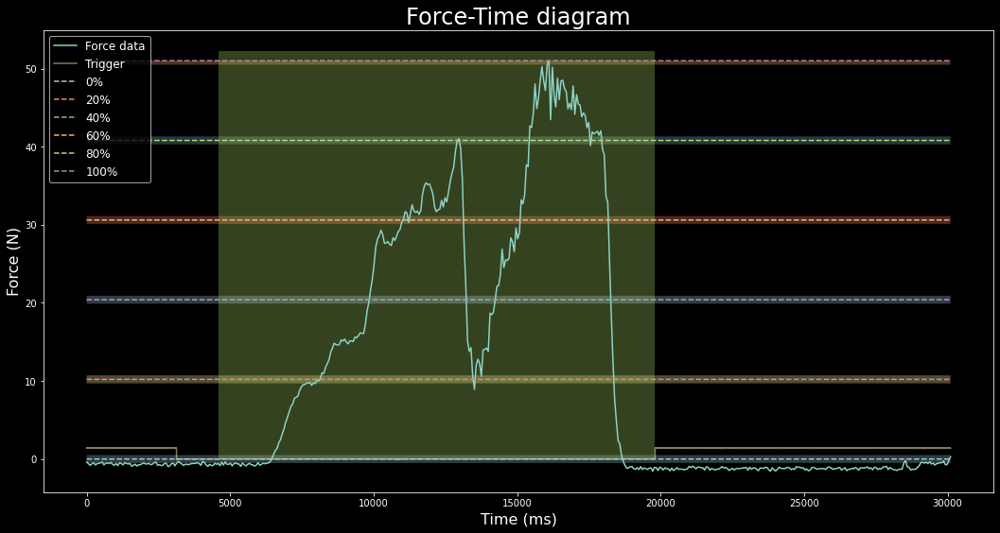

In [7]:
## E:\0A_lab_data\00_Cases\20231028_3_UC\E0002220\MP01.dcm,E:\0A_lab_data\00_Cases\20231028_3_UC\MP01.txt
file = AliceV05()

## Show all image

<ipython-input-84-b3026bdc6329>:17: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (12,12))


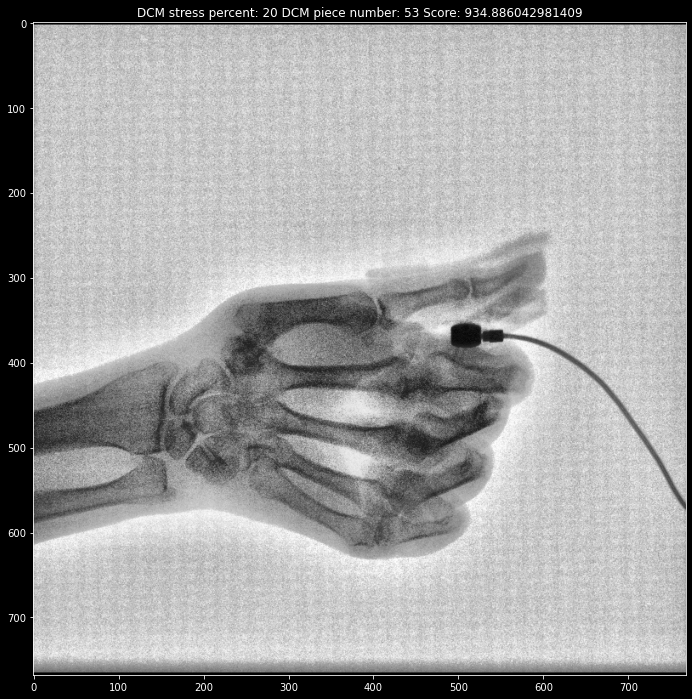

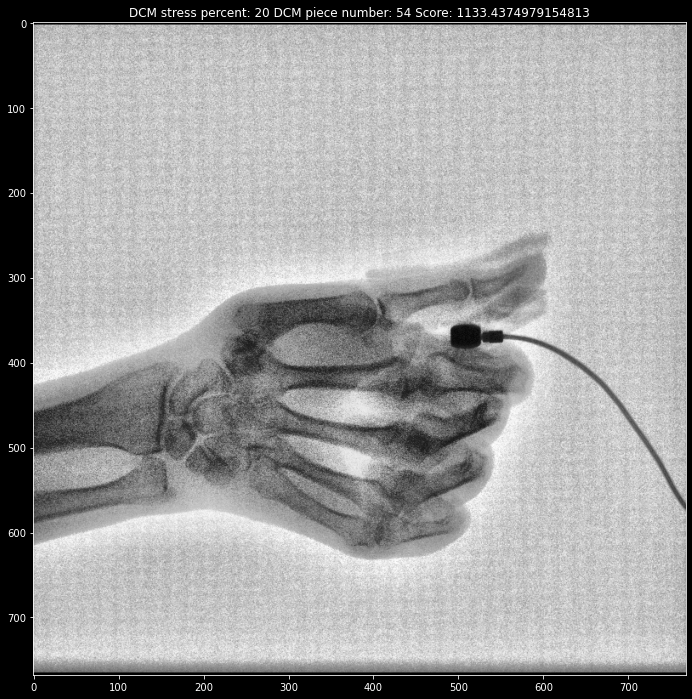

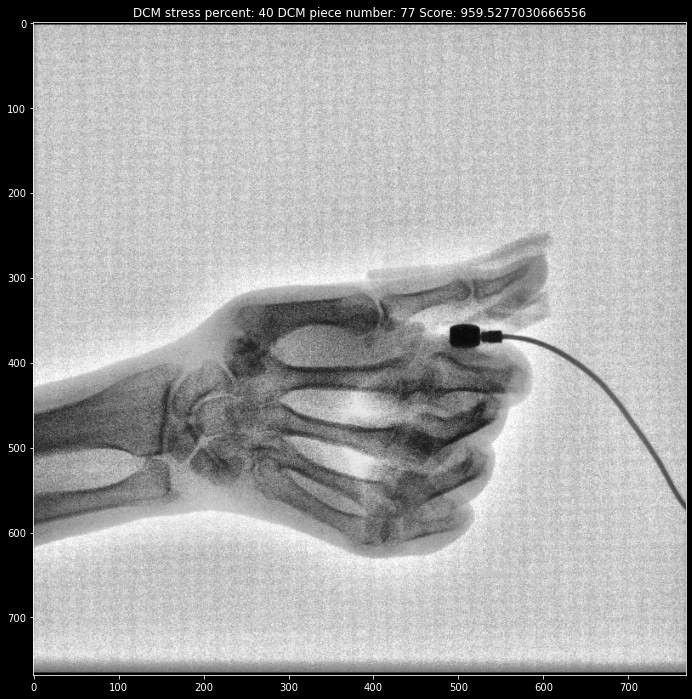

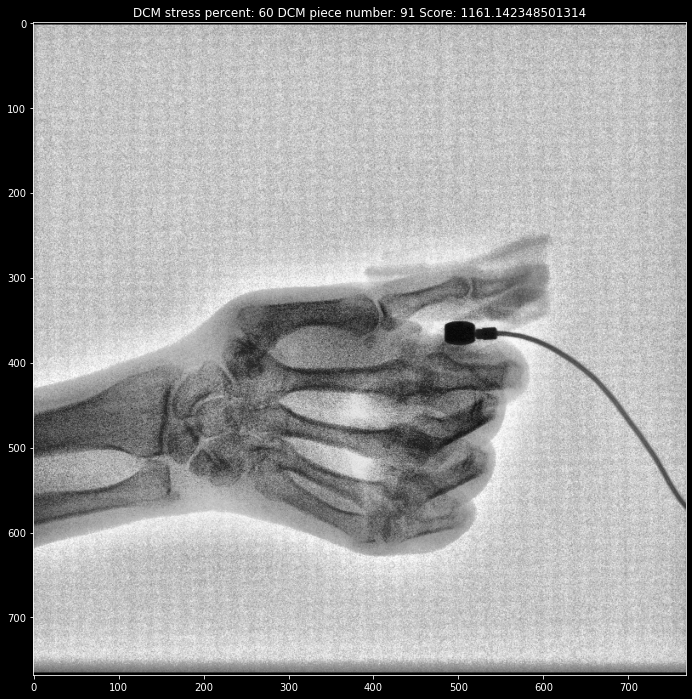

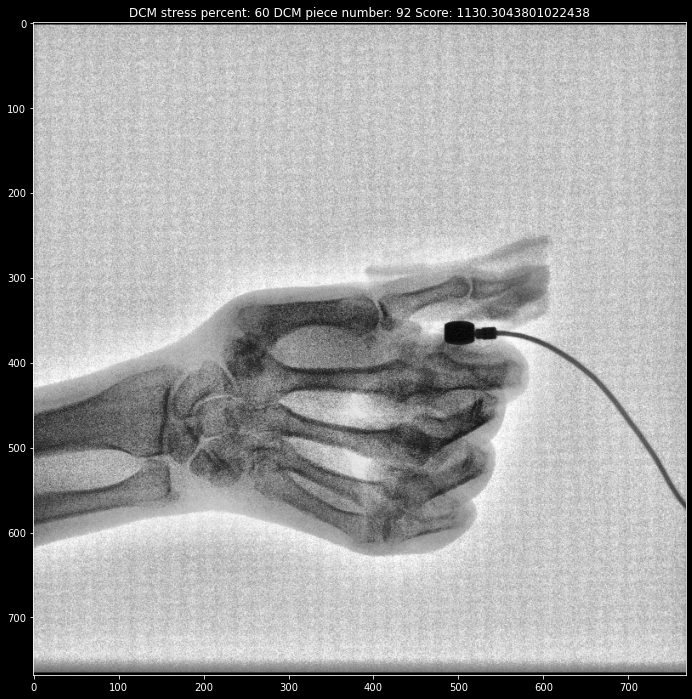

...

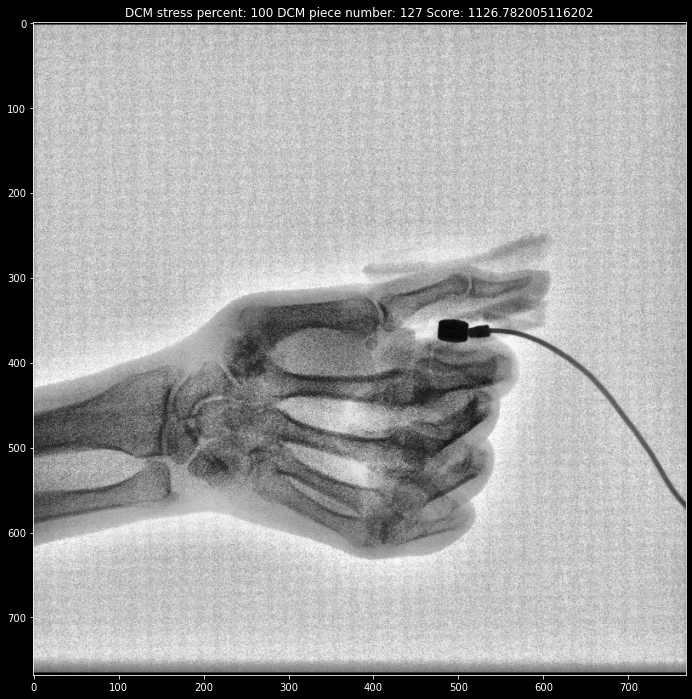

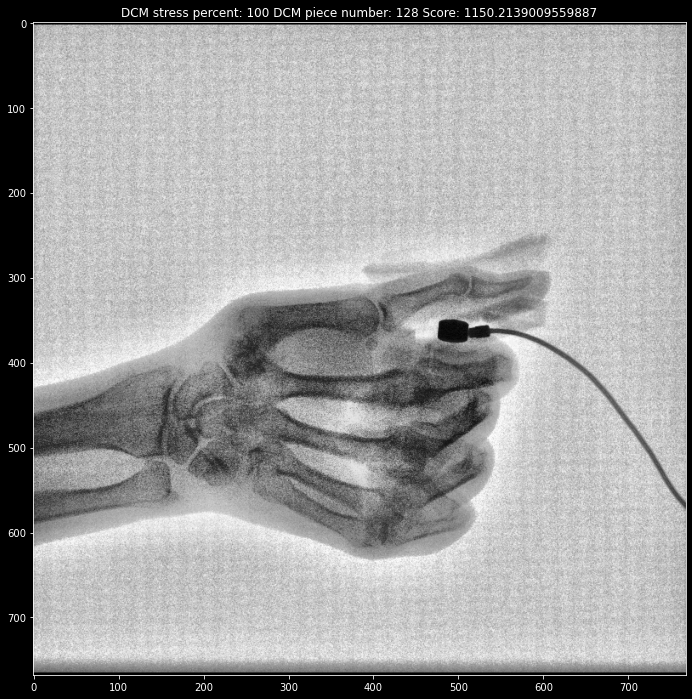

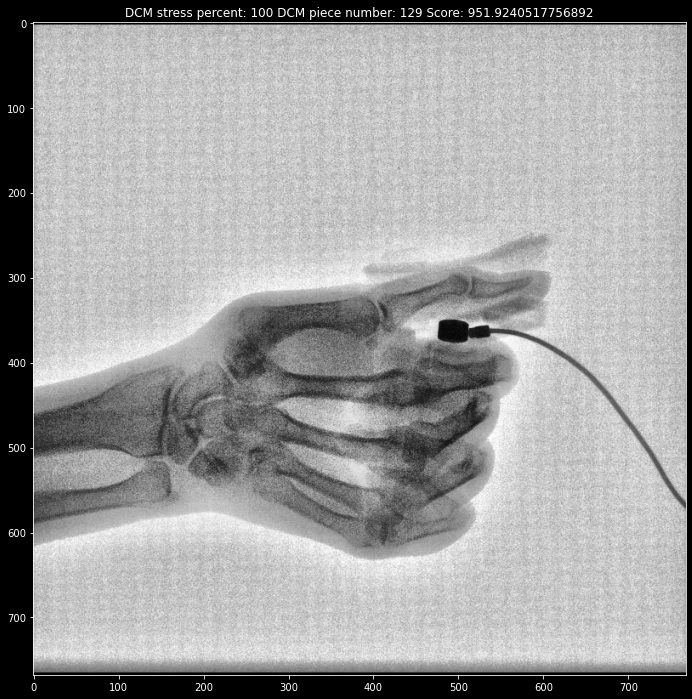

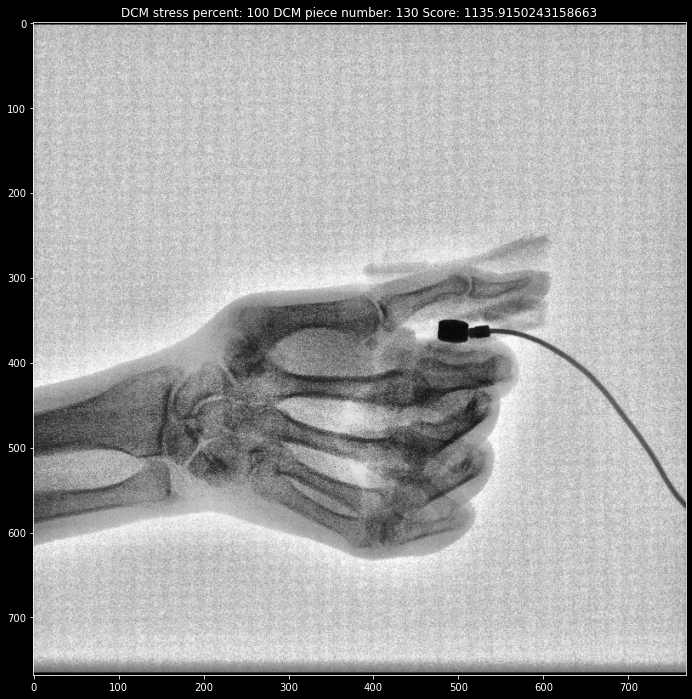

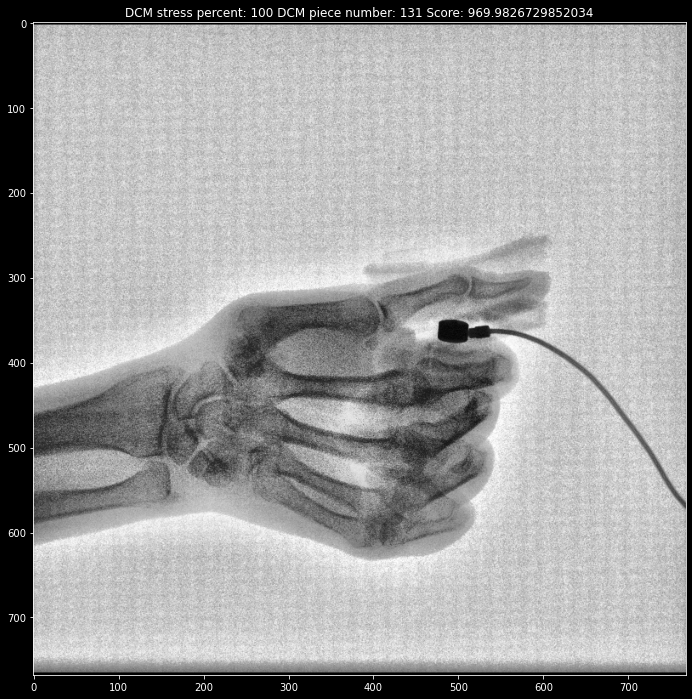

In [84]:
start = file.time_note[-1]-len(file.img)*100
end = file.time_note[-1]
LDF = len(file.df)
stress_percent = round(100/LDF)
imgf64 = file.img/((file.img).max()-file.img.min())
img8 = np.array(imgf64*255,dtype=np.uint8)

dcm = []
clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
for i in img8:
    dcm.append(clahe.apply(i))

for i in range(LDF):
    DF_t = round((file.df[i]['Slice Time(ms)']-start)/100)
    DF_t = DF_t.astype(int)
    for j in np.unique(DF_t):
        fig = plt.figure(figsize = (12,12))
        laplacian = cv2.Laplacian(dcm[j],cv2.CV_8U)
        score = (np.var(laplacian))
        title = "DCM stress percent: %s DCM piece number: %s Score: %s" %(str(stress_percent*(i+1)),str(j+1),score)
        #title = "DCM stress percent: "+str(stress_percent*(i+1))+"% DCM piece number: "+str(j)
        plt.imshow(dcm[j],cmap="gray"),plt.title(title)
#for i in range(len(DF)):
#    DF_t = DF[i]['Slice Time(ms)']-start

## JPG save

In [171]:
L = [10,35,54,71,83,103,113,119,127,135,140]
for i in range(len(L)):
    filename = str('N40KPH01_')+str(i*10)+str('.jpg')
    plt.imsave(filename,dcm[L[i]-1],cmap='gray')

## NII save

In [124]:
import nibabel as nib


imgC =[]
imgC2 = []
for i in [18,23,60,80,120,121]:
    imgC.append(img8[i-1])
    imgC2.append(dcm[i-1])
img = nib.Nifti1Image(np.array(imgC).transpose(2,1,0), np.eye(4))  # Save axis for data (just identity)
img.header.get_xyzt_units()
nib.save(img,r'E:\0A_lab_data\label\N23_KP01.nii')  # Save as NiBabel file

img = nib.Nifti1Image(np.array(imgC2).transpose(2,1,0), np.eye(4))  # Save axis for data (just identity)
img.header.get_xyzt_units()
nib.save(img,r'E:\0A_lab_data\label\CLAHE\N23_KP01_C.nii')

In [20]:
10,25,30,55,76,120
10,34,49,52,57,67
10,43,83,85,92,104
10,25,49,79,91,107
10,31,64,86,103,111
10,34,45,83,89,94

(10, 18, 25, 74, 100, 113)